In [1]:
import geopandas as gpd
import pandas as pd
import sqlalchemy
import numpy as np
import shapely
import json
import matplotlib.pyplot as plt

import plotly
import plotly.express as px
import plotly.graph_objects as go
token = open("C:\\Users\\comp\\Documents\\chicago_crime\\mapbox_token2.txt").read()

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 200)


import sys
sys.path.insert(1, r'C:\Users\comp\Documents\New York')
import geoTim

pg = open('db_credentials.txt')
db = pg.read()
pg.close()

engine = sqlalchemy.create_engine(db)

df = gpd.read_postgis('select * FROM police_beats', con = engine)

show how casting to geograpy works

1. look at dependent variable and transform if necessary
2. look at basic stats of independent variables
    decide which to keep/or throw away
3. perform imputation
4. apply transformations if needed to independent variables
5. correlation matrix 
6. apply pca
7. apply regression on pcomponents
8. analyze!


In [2]:
df

,gid,beat,beat_num,district,sector,geom,attendance_rate,graduation_rate,college_enrollment_rate,budget_per_student,sat_score,suspensions,life_expectancy,teen_birth_rate,birth_rate,lu_residential,lu_commercial,lu_industrial,lu_open_space,lu_total,lu_residential_perc,lu_commercial_perc,lu_industrial_perc,lu_open_space_perc,num_walmarts,num_liqour,distance_to_highway,num_bus_stops,mean_house_values_sqft,num_houses_rented,num_houses_owned,num_households,num_male_householder_no_wife,num_female_householder_no_husband,avg_family_size,commute_time,perc_pop_abv_62,perc_male,perc_female,pop_abv_25,pop_abv_25_less_9th_grade,pop_abv_25_9_to_12th_grade,pop_abv_25_high_shool_grad,pop_abv_25_some_college,pop_abv_25_assoc_degree,pop_abv_25_bach_degree,pop_abv_25_grad_degree,pop_abv_25_hs_or_higher,pop_abv_25_bs_or_higher,pop_abv_15,pop_abv_15_never_married,pop_abv_15_seperated,pop_abv_15_divorced,pop_abv_15_now_married,perc_below_poverty,house_median_income,house_mean_income,unemp_rate_20_to_64,perc_green,total_crime,violent_crimes,non_violent_crimes,population,area
0,159,3,1034,10,3,"MULTIPOLYGON (((-87.66602 41.85233, -87.66602 ...",87.525450,74.114592,57.465512,10845.076555,877.309080,1.051633e+01,81.667995,58.547320,17.504981,4.277412e-05,2.525957e-05,9.495767e-05,6.360428e-07,0.000363,0.117755,0.069538,0.261413,0.001751,1,2,229.356425,66,76.0,172.0,84.0,954,287,604,3.616575,24.247230,10.765542,59.443030,40.556970,7051.049480,1215.517718,1472.549889,2029.821287,898.065717,391.922611,760.676828,282.495431,4362.981873,1043.172259,9328.375100,126.769361,13.228709,18.551049,90.341631,26.532974,41676.427141,55862.718459,6.155843,0.235016,3726,361,3365,11529.401156,3.350765
1,157,1,0914,09,1,"MULTIPOLYGON (((-87.63193 41.86015, -87.63117 ...",83.316893,59.245098,57.149030,14095.432804,843.112381,5.335060e+01,81.284243,21.471701,11.910490,7.806348e-05,1.897350e-05,8.630383e-06,6.956347e-06,0.000270,0.289434,0.070348,0.031999,0.025792,0,1,0.000000,61,108.0,303.0,222.0,2291,283,1120,3.314558,23.462919,25.151238,48.903361,51.096639,14349.328095,3370.132368,1093.280959,4267.907480,1498.853009,539.204997,2432.329428,1147.619855,9885.914769,3579.949283,16327.599090,170.239859,6.127160,38.465888,260.181237,26.872445,37948.928250,56130.224564,7.519471,0.226135,3028,433,2595,18926.808213,2.487891
2,90,1,1113,11,1,"MULTIPOLYGON (((-87.73570 41.88766, -87.73569 ...",75.692905,60.326395,60.703169,20731.493636,798.774075,6.622513e+01,70.362168,98.220073,19.041757,2.823147e-05,5.845979e-06,1.217118e-05,2.079707e-07,0.000105,0.268777,0.055656,0.115875,0.001980,0,0,364.819294,20,30.0,161.0,43.0,565,108,649,3.984621,31.596967,15.920190,44.809946,55.190054,2795.052391,180.112084,686.180704,951.810186,661.599523,145.804505,125.261202,44.284188,1928.759603,169.545390,3485.202185,134.857531,11.116562,14.541647,29.848135,37.093819,23527.742173,34940.678624,20.440352,0.395489,4928,685,4243,4738.994735,0.968363
3,158,3,1235,12,3,"MULTIPOLYGON (((-87.63562 41.86009, -87.63451 ...",87.101458,78.496851,62.796056,9519.277423,875.994697,7.797681e+00,81.316733,48.589874,16.556531,3.541778e-05,1.492817e-05,8.529050e-05,3.765591e-06,0.000296,0.119564,0.050395,0.287925,0.012712,0,4,0.000000,45,91.0,374.0,177.0,2197,371,614,3.434674,23.252177,13.770985,54.075217,45.924783,7742.470123,1299.771002,692.891735,1370.822606,1083.817837,337.084232,1806.259358,1151.823354,5749.807386,2958.082711,9087.578452,295.560093,23.118440,40.337801,163.821522,21.863703,51959.901362,64444.843449,5.768370,0.181637,2396,209,2187,10520.253501,2.732184
4,55,1,2012,20,1,"MULTIPOLYGON (((-87.67215 41.99078, -87.67179 ...",92.200000,80.963747,73.747483,9826.649971,980.200177,1.005249e+01,80.308277,32.018362,15.730550,6.798587e-05,1.168225e-05,1.652642e-05,2.726145e-07,0.000299,0.227016,0.039009,0.055184,0.000910,0,3,1281.236931,46,239.0,161.0,139.0,2350,118,242,3.070868,12.332436,14.975941,49.753030,50.246970,7590.652414,267.088621,463.954467,758.185498,1165.838055,325.001228,2745.662376,1864.922169,6859.

In [3]:
df.columns

Index(['gid', 'beat', 'beat_num', 'district', 'sector', 'geom',
       'attendance_rate', 'graduation_rate', 'college_enrollment_rate',
       'budget_per_student', 'sat_score', 'suspensions', 'life_expectancy',
       'teen_birth_rate', 'birth_rate', 'lu_residential', 'lu_commercial',
       'lu_industrial', 'lu_open_space', 'lu_total', 'lu_residential_perc',
       'lu_commercial_perc', 'lu_industrial_perc', 'lu_open_space_perc',
       'num_walmarts', 'num_liqour', 'distance_to_highway', 'num_bus_stops',
       'mean_house_values_sqft', 'num_houses_rented', 'num_houses_owned',
       'num_households', 'num_male_householder_no_wife',
       'num_female_householder_no_husband', 'avg_family_size', 'commute_time',
       'perc_pop_abv_62', 'perc_male', 'perc_female', 'pop_abv_25',
       'pop_abv_25_less_9th_grade', 'pop_abv_25_9_to_12th_grade',
       'pop_abv_25_high_shool_grad', 'pop_abv_25_some_college',
       'pop_abv_25_assoc_degree', 'pop_abv_25_bach_degree',
       'pop_abv_25_

C:\Users\comp\anaconda3\envs\geopandas_env\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\comp\anaconda3\envs\geopandas_env\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([14., 53., 76., 47., 16., 18., 29.,  9.,  1.,  9.]),
 array([ 759.00000371,  791.80000334,  824.60000297,  857.4000026 ,
         890.20000222,  923.00000185,  955.80000148,  988.60000111,
        1021.40000074, 1054.20000037, 1087.        ]),
 <a list of 10 Patch objects>)

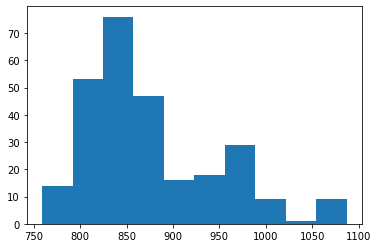

In [4]:
plt.hist(df['sat_score'])

In [5]:
df['perc_hs_or_higher'] = df['pop_abv_25_hs_or_higher']/df['pop_abv_25']
df['perc_college_or_higher'] = df['pop_abv_25_bs_or_higher']/df['pop_abv_25']
df['perc_houses_rented'] = df['num_houses_rented']/df['num_households']
df['perc_houses_owned'] = df['num_houses_owned']/df['num_households']
df['pop_per_km2'] = df['population'] / df['area']
df['perc_male_householder'] = df['num_male_householder_no_wife']/df['num_households']
df['perc_female_householder'] = df['num_female_householder_no_husband']/df['num_households']
df['bus_stops_km2'] = df['num_bus_stops']/df['area']
df['num_liqour_km2'] = df['num_liqour']/df['area']
df['people_per_house'] = df['population']/df['num_households']

df['lu_commercial_perc_log10'] = np.log10(df['lu_commercial_perc']+1)
df['lu_industrial_perc_log10'] = np.log10(df['lu_industrial_perc']+1)
df['lu_open_space_perc_log10'] = np.log10(df['lu_open_space_perc']+1)
df['distance_to_highway_log10'] = np.log10(df['distance_to_highway']+1)
df['bus_stops_km2_log10'] = np.log10(df['bus_stops_km2']+1)
df['num_liqour_km2_log10'] = np.log10(df['num_liqour_km2']+1)


(array([104.,   0.,   0.,   2.,   7.,   7.,  19.,  43.,  52.,  43.]),
 array([0.        , 0.37257498, 0.74514997, 1.11772495, 1.49029993,
        1.86287492, 2.2354499 , 2.60802488, 2.98059986, 3.35317485,
        3.72574983]),
 <a list of 10 Patch objects>)

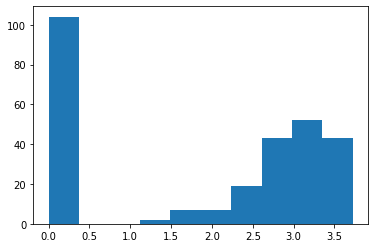

In [6]:
#plt.hist(df_x['mean_house_values_sqft'])
# df_x['mean_house_values_sqft'].min()
#plt.hist(df['num_liqour_km2'])
#plt.hist(np.log10(df['num_liqour_km2']+1))
plt.hist(df['distance_to_highway_log10'])

In [7]:
# plt.hist(df['lu_commercial_perc_log10'])

log:
lu_commercial, industrial, open space, distance to highway, bus stops, num liquor

has outliers: 
    avg_family size (replace values < 2 with 2), 
    perc male, merc femal (not householder; remove these) e, 
    sat score; 
    pop_km2

filter rows on med income
filter out beatnum 1654 (airport)

beat 0121 has home values of 0; replace with mean/ or home values around it??

In [8]:
df = df[df['beat_num'] != '1654']
df.loc[df['beat_num'] == '0121','mean_house_values_sqft'] = np.nan
df.to_csv('input_data_filt.csv', index=False)



df_id = df['beat_num']
df_y = df['total_crime'] / df['area']

df_x = df.filter(['attendance_rate', 'graduation_rate', 'college_enrollment_rate',
       'budget_per_student', 'sat_score', 'suspensions', 'life_expectancy',
       'teen_birth_rate', 'birth_rate', 'lu_residential_perc', 
       'mean_house_values_sqft', 'avg_family_size', 'commute_time',
       'perc_pop_abv_62', 'perc_male', 'perc_female', 'perc_below_poverty',
       'house_median_income', 'house_mean_income', 'unemp_rate_20_to_64',
       'perc_green', 'perc_hs_or_higher', 'perc_college_or_higher',
       'perc_houses_rented', 'perc_houses_owned', 'pop_per_km2',
       'perc_male_householder', 'perc_female_householder', 'people_per_house',
       'lu_commercial_perc_log10', 'lu_industrial_perc_log10',
       'lu_open_space_perc_log10'])

df_x_map = df.filter(['beat_num','geom','attendance_rate', 'graduation_rate', 'college_enrollment_rate',
       'budget_per_student', 'sat_score', 'suspensions', 'life_expectancy',
       'teen_birth_rate', 'birth_rate', 'lu_residential_perc', 
       'mean_house_values_sqft', 'avg_family_size', 'commute_time',
       'perc_pop_abv_62', 'perc_male', 'perc_female', 'perc_below_poverty',
       'house_median_income', 'house_mean_income', 'unemp_rate_20_to_64',
       'perc_green', 'perc_hs_or_higher', 'perc_college_or_higher',
       'perc_houses_rented', 'perc_houses_owned', 'pop_per_km2',
       'perc_male_householder', 'perc_female_householder', 'people_per_house',
       'lu_commercial_perc_log10', 'lu_industrial_perc_log10',
       'lu_open_space_perc_log10'])
# REMOVED:
# 'num_liqour_km2_log10'
# 'bus_stops_km2_log10'
# 'num_walmarts',
# 'distance_to_highway_log10'

df.to_csv('input_data.csv', index=False)
df_x_map.to_csv('df_x_map.csv', index=False)

C:\Users\comp\anaconda3\envs\geopandas_env\lib\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [9]:
df_x.columns

Index(['attendance_rate', 'graduation_rate', 'college_enrollment_rate',
       'budget_per_student', 'sat_score', 'suspensions', 'life_expectancy',
       'teen_birth_rate', 'birth_rate', 'lu_residential_perc',
       'mean_house_values_sqft', 'avg_family_size', 'commute_time',
       'perc_pop_abv_62', 'perc_male', 'perc_female', 'perc_below_poverty',
       'house_median_income', 'house_mean_income', 'unemp_rate_20_to_64',
       'perc_green', 'perc_hs_or_higher', 'perc_college_or_higher',
       'perc_houses_rented', 'perc_houses_owned', 'pop_per_km2',
       'perc_male_householder', 'perc_female_householder', 'people_per_house',
       'lu_commercial_perc_log10', 'lu_industrial_perc_log10',
       'lu_open_space_perc_log10'],
      dtype='object')

In [10]:
desc = df_x.describe().transpose()

desc = desc.round(decimals=2)

desc.to_html('summary_table_v2.html')
desc.to_csv('summary_table.csv')

In [11]:
# identify outliers in the training dataset
#iso = IsolationForest(contamination=0.1)
#yhat = iso.fit_predict(df_x)


#clf.predict([[0.1], [0], [90]])

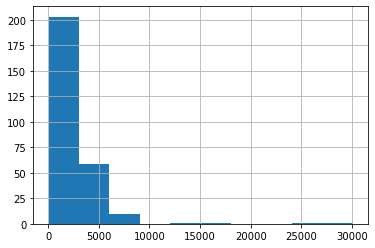

In [12]:
df_y.hist()

In [13]:
from scipy.stats import boxcox

y_pp, y_lambda = boxcox(df_y+1)

(array([ 1.,  4.,  9., 44., 89., 90., 30.,  6.,  1.,  2.]),
 array([ 4.31212402,  6.56832003,  8.82451603, 11.08071204, 13.33690805,
        15.59310406, 17.84930007, 20.10549607, 22.36169208, 24.61788809,
        26.8740841 ]),
 <a list of 10 Patch objects>)

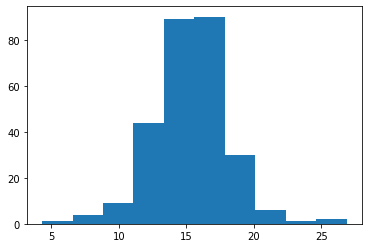

In [14]:
plt.hist(y_pp)

In [15]:
import numpy as np
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)
df_x_pp = pd.DataFrame(imputer.fit_transform(df_x), columns = df_x.columns)
df_x_pp.to_csv('df_x.csv', index=False)
df_x_pp

,attendance_rate,graduation_rate,college_enrollment_rate,budget_per_student,sat_score,suspensions,life_expectancy,teen_birth_rate,birth_rate,lu_residential_perc,mean_house_values_sqft,avg_family_size,commute_time,perc_pop_abv_62,perc_male,perc_female,perc_below_poverty,house_median_income,house_mean_income,unemp_rate_20_to_64,perc_green,perc_hs_or_higher,perc_college_or_higher,perc_houses_rented,perc_houses_owned,pop_per_km2,perc_male_householder,perc_female_householder,people_per_house,lu_commercial_perc_log10,lu_industrial_perc_log10,lu_open_space_perc_log10
0,87.525450,74.114592,57.465512,10845.076555,877.309080,1.051633e+01,81.667995,58.547320,17.504981,0.117755,76.0,3.616575,24.247230,10.765542,59.443030,40.556970,26.532974,41676.427141,55862.718459,6.155843,0.235016,0.618771,0.147946,0.180294,0.088050,3440.826531,0.300839,0.633124,12.085326,0.029196,0.100857,0.000760
1,83.316893,59.245098,57.149030,14095.432804,843.112381,5.335060e+01,81.284243,21.471701,11.910490,0.289434,108.0,3.314558,23.462919,25.151238,48.903361,51.096639,26.872445,37948.928250,56130.224564,7.519471,0.226135,0.688946,0.249485,0.132257,0.096901,7607.569794,0.123527,0.488869,8.261374,0.029525,0.013679,0.011059
2,75.692905,60.326395,60.703169,20731.493636,798.774075,6.622513e+01,70.362168,98.220073,19.041757,0.268777,30.0,3.984621,31.596967,15.920190,44.809946,55.190054,37.093819,23527.742173,34940.678624,20.440352,0.395489,0.690062,0.060659,0.284956,0.076106,4893.821057,0.191150,1.148673,8.387601,0.023523,0.047616,0.000859
3,87.101458,78.496851,62.796056,9519.277423,875.994697,7.797681e+00,81.316733,48.589874,16.556531,0.119564,91.0,3.434674,23.252177,13.770985,54.075217,45.924783,21.863703,51959.901362,64444.843449,5.768370,0.181637,0.742632,0.382059,0.170232,0.080564,3850.492631,0.168867,0.279472,4.788463,0.021353,0.109890,0.005486
4,92.200000,80.963747,73.747483,9826.649971,980.200177,1.005249e+01,80.308277,32.018362,15.730550,0.227016,239.0,3.070868,12.332436,14.975941,49.753030,50.246970,11.668571,82593.318765,107598.194759,2.312252,0.610052,0.903692,0.607403,0.068511,0.059149,3454.062858,0.050213,0.102979,4.051753,0.016619,0.023328,0.000395
5,82.357903,52.772317,62.456013,14038.124939,852.050699,2.963862e+01,75.971903,75.888399,19.469849,0.440282,70.0,4.112117,23.272735,9.741401,49.113846,50.886154,26.842345,38227.126991,52088.123568,13.308537,0.391066,0.622977,0.133187,0.188321,0.081752,7357.445845,0.400000,0.950365,14.088444,0.039478,0.016906,0.004428
6,88.533562,64.780937,53.022837,13889.810567,851.386315,1.177667e+01,77.581530,60.211342,18.953455,0.220702,242.0,3.292654,22.798203,10.958098,50.136086,49.863914,18.453176,65972.229553,99078.370508,6.880049,0.223253,0.889781,0.542477,0.125758,0.111616,4025.588333,0.103030,0.229293,4.638681,0.027802,0.078398,0.007153
7,76.400000,41.500003,41.700003,30461.998506,759.000006,5.500000e+01,70.820386,99.644260,19.322394,0.165885,26.0,3.842616,23.498269,14.565065,46.572734,53.427266,36.206085,28713.950024,39166.542721,11.313111,0.419802,0.707680,0.085359,0.264479,0.094595,3890.180402,0.150579,1.281853,9.283078,0.010007,0.076386,0.002622
8,92.827251,85.660456,71.412669,11336.112428,937.029002,4.394047e+00,78.307609,89.601096,19.923924,0.303637,39.0,3.723590,22.010919,16.376201,53.518540,46.481460,26.298379,33630.152010,43243.413248,9.890741,0.314411,0.554310,0.109780,0.326870,0.211911,6375.002485,0.437673,0.980609,14.507709,0.034808,0.053648,0.001157
9,87.750921,73.655909,63.113392,11988.060233,898.231002,7.847071e+00,77.300000,40.800000,16.400000,0.368300,117.0,3.103501,12.877317,12.814815,49.254267,50.745733,26.388395,41340.753698,62364.936079,6.597930,0.340337,0.874119,0.466824,0.072452,0.020276,8443.903625,0.062179,0.116788,3.410815,0.023538,0.050783,0.005377


In [16]:
from sklearn.ensemble import IsolationForest
clf = IsolationForest(random_state=0, contamination=0.1).fit_predict(df_x_pp)
clf

array([ 1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,
        1,  1,  1,  1,  1, -1,  1,  1, -1,  1,  1, -1,  1,  1, -1, -1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,
        1, -1,  1,  1,  1, -1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1, -1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1, -1,  1,  1,  1,  1,  1,
        1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1

In [17]:
df_x_pp.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
attendance_rate,276.0,86.804543,4.592531,74.400000,83.700000,87.572826,90.877143,94.300000
graduation_rate,276.0,67.199840,11.427867,30.300000,58.659937,67.800000,75.972737,92.500000
college_enrollment_rate,276.0,60.458347,11.852022,35.800003,50.900000,61.208498,69.599998,88.600000
budget_per_student,276.0,13371.924404,4552.925693,7739.000000,9828.000000,12066.110449,16076.568823,30461.998787
sat_score,276.0,874.694833,69.535991,759.000004,825.808536,857.000000,915.548841,1087.000000
suspensions,276.0,24.768069,20.520915,0.000000,7.839520,18.058115,39.565503,70.400000
life_expectancy,276.0,77.012509,4.270550,68.800000,73.272726,77.554050,80.300000,85.200000
teen_birth_rate,276.0,55.934652,29.843765,1.300000,34.012818,58.280631,77.600000,116.900000
birth_rate,276.0,16.363367,3.213022,9.400000,13.641887,16.937647,19.053619,22.400000
lu_residential_perc,276.0,0.335424,0.142513,0.000000,0.227369,0.354269,0.450291,0.604083


In [18]:
for col in df_x_pp.columns:
    #print(col)
    df_x_pp[col] = boxcox(df_x_pp[col] + 1)[0]
df_x_pp
df_x_pp.to_csv('df_x_after_transform.csv', index=False)

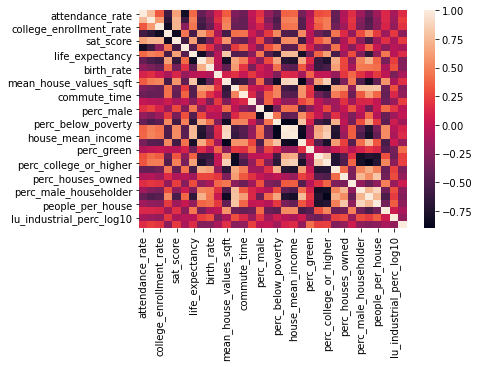

In [19]:
import seaborn as sn
corr = df_x_pp.corr()
sn.heatmap(corr)

In [20]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Heatmap(z=corr,
                                x=df_x_pp.columns,
                                y=df_x_pp.columns,
                                colorscale = 'RdBu',
                               zmax = 1,
                               zmin = -1))

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),
    #paper_bgcolor="LightSteelBlue",
    width=700, height=600,
    font=dict(
    #family="Courier New, monospace",
    size=8,
    #color="#7f7f7f"
    )
)

fig.show()

In [21]:
import scipy
import scipy.cluster.hierarchy as sch

# source: https://wil.yegelwel.com/cluster-correlation-matrix/

def cluster_corr(corr_array, inplace=False):
    """
    Rearranges the correlation matrix, corr_array, so that groups of highly 
    correlated variables are next to eachother 
    
    Parameters
    ----------
    corr_array : pandas.DataFrame or numpy.ndarray
        a NxN correlation matrix 
        
    Returns
    -------
    pandas.DataFrame or numpy.ndarray
        a NxN correlation matrix with the columns and rows rearranged
    """
    pairwise_distances = sch.distance.pdist(corr_array)
    linkage = sch.linkage(pairwise_distances, method='complete')
    cluster_distance_threshold = pairwise_distances.max()/2
    idx_to_cluster_array = sch.fcluster(linkage, cluster_distance_threshold, 
                                        criterion='distance')
    idx = np.argsort(idx_to_cluster_array)
    
    if not inplace:
        corr_array = corr_array.copy()
    
    if isinstance(corr_array, pd.DataFrame):
        return corr_array.iloc[idx, :].T.iloc[idx, :]
    return corr_array[idx, :][:, idx]

In [22]:
import plotly.graph_objects as go

df_x_pp_corr = cluster_corr(df_x_pp.corr())

mask = np.zeros_like(df_x_pp_corr, dtype=np.bool)
mask[np.tril_indices_from(mask)] = True


fig = go.Figure(data=go.Heatmap(z=df_x_pp_corr.mask(mask),
                                x=df_x_pp_corr.columns,
                                y=df_x_pp_corr.columns,
                                colorscale = 'RdBu',
                               zmax = 1,
                               zmin = -1,
                               colorbar = {'thickness':20})) #'outlinecolor' : 'black', 'outlinewidth' : 1

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),
    #paper_bgcolor="LightSteelBlue",
    width=650, height=550,
    yaxis=dict(tickfont=dict(size=6)),
    xaxis=dict(tickfont=dict(size=6))
)

fig.write_html('corr_plot.html', include_plotlyjs='cdn')
fig.show()

In [23]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

pca = PCA(n_components = 10)
df_x_pp_scaled = StandardScaler().fit_transform(df_x_pp)
scores = pca.fit_transform(df_x_pp_scaled)
print('scores: ',scores)
print('ev',pca.explained_variance_)
print('evr',pca.explained_variance_ratio_)
print('sv',pca.singular_values_)
print('comp',pca.components_)

scores:  [[-0.65967365  4.2026083  -1.93339637 ...  0.51264618  1.69878611
  -1.1123581 ]
 [-0.39188138 -0.04893941 -0.86530222 ...  2.62731386  1.29215033
  -0.7013303 ]
 [-5.70753168 -0.36682048 -1.35447919 ...  0.44758661 -0.69623351
  -1.49935147]
 ...
 [ 6.88254463  1.41936133  1.05899003 ... -0.94719506  0.32941404
  -0.34591371]
 [ 5.91726471  0.12097067 -0.94242881 ... -0.46551861  1.05044073
  -0.27912395]
 [-5.2349779  -1.75281175  0.49662462 ...  0.37455878 -0.60512441
   0.43310833]]
ev [13.64474281  3.85079987  3.06345172  1.80678732  1.49115573  1.23945492
  1.13415548  0.80335979  0.72828078  0.60790085]
evr [0.42486438 0.11990462 0.0953885  0.056259   0.04643099 0.03859364
 0.03531487 0.02501469 0.02267691 0.01892857]
sv [61.25605498 32.5418187  29.02497585 22.29050277 20.25013153 18.46212619
 17.66048577 14.86351046 14.15193322 12.92952956]
comp [[ 1.42681917e-01  1.74890674e-01  1.64230840e-01 -1.85037769e-01
   1.99161028e-01 -1.42367792e-01  2.14386926e-01 -2.298493

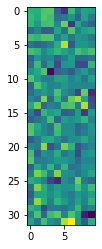

In [24]:
#plt.imshow(pca.components_)
loadings = pca.components_.T
plt.imshow(loadings)

In [25]:
loadings

array([[ 1.42681917e-01,  1.25774005e-01,  2.35928867e-01,
         2.47958586e-01, -2.14035023e-01, -3.97390220e-01,
         1.77026213e-01, -1.21627814e-01,  8.22134412e-02,
         6.51651691e-02],
       [ 1.74890674e-01,  1.15877698e-01,  2.49464153e-01,
         2.05094648e-01, -1.57472232e-01, -1.02448962e-01,
         6.60378457e-03, -2.07850472e-01,  7.31442956e-02,
        -1.04725546e-01],
       [ 1.64230840e-01,  3.13973087e-02,  2.05130403e-01,
         2.17119868e-01, -4.70615800e-02,  2.95100954e-01,
        -3.83819096e-01,  1.00669673e-01, -1.26534779e-01,
        -2.17745628e-01],
       [-1.85037769e-01, -7.25440404e-02, -2.45128500e-01,
        -2.26480107e-01,  8.91908217e-02, -1.45617237e-01,
         2.37704117e-01, -6.64777060e-02,  6.78930519e-02,
         1.13503764e-01],
       [ 1.99161028e-01,  1.56690393e-01,  2.34810330e-01,
         2.24050178e-01, -8.39883669e-02,  7.85839038e-02,
        -1.29339611e-01,  2.66392229e-02, -2.09386843e-02,
        -1.

In [26]:
fig = go.Figure(data=[go.Table(
    header=dict(values=['PC 1','PC 2','PC 3','PC 4','PC 5','PC 6','PC 7','PC 8','PC 9','PC 10'],
                line_color='darkslategray',
                fill_color='lightskyblue',
                align='left'),
    cells=dict(values=np.around(loadings.T,2), # 2nd column
               line_color='darkslategray',
               fill_color='lightcyan',
               align='left'))
])

fig.update_layout(width=800, height=700)
fig.show()

In [27]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Heatmap(z=loadings,
                                x=['<b>PC 1</b>','<b>PC 2</b>','<b>PC 3</b>','<b>PC 4</b>','<b>PC 5</b>','<b>PC 6</b>','<b>PC 7</b>','<b>PC 8</b>','<b>PC 9</b>','<b>PC 10</b>'],
                                y=df_x_pp.columns,
                                colorscale = 'PiYG',
                               zmax = 0.5,
                               zmin = -0.5,
                                colorbar = {'thickness':20}))

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),
    #paper_bgcolor="LightSteelBlue",
    width=600, height=500,
    yaxis=dict(tickfont=dict(size=6)),
    xaxis=dict(tickfont=dict(size=10),side='top')
)

fig.show()
fig.write_html('pc_loadings.html', include_plotlyjs='cdn')

In [28]:
import plotly.express as px

#print('evr',pca.explained_variance_ratio_)

ev = pca.explained_variance_ratio_
#px.scatter(ev, mode='lines+markers')

fig = go.Figure()

fig.add_trace(go.Scatter(x=np.arange(len(ev))+1,y=ev,
                    mode='lines+markers', marker=dict(size=8)))

fig.update_layout(width=500,height=400,
                  margin=dict(l=0, r=0, t=40, b=0),
                 title='PC Explained Variance Ratio',
                 xaxis_title="Principal Component",
                 yaxis_title="Variance Ratio")

fig.show()
fig.write_html('scree_plot.html', include_plotlyjs='cdn')

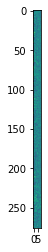

In [29]:
np.shape(scores)
np.shape(scores[:,:5])
x_pc = scores#[:,:8]
plt.imshow(x_pc)

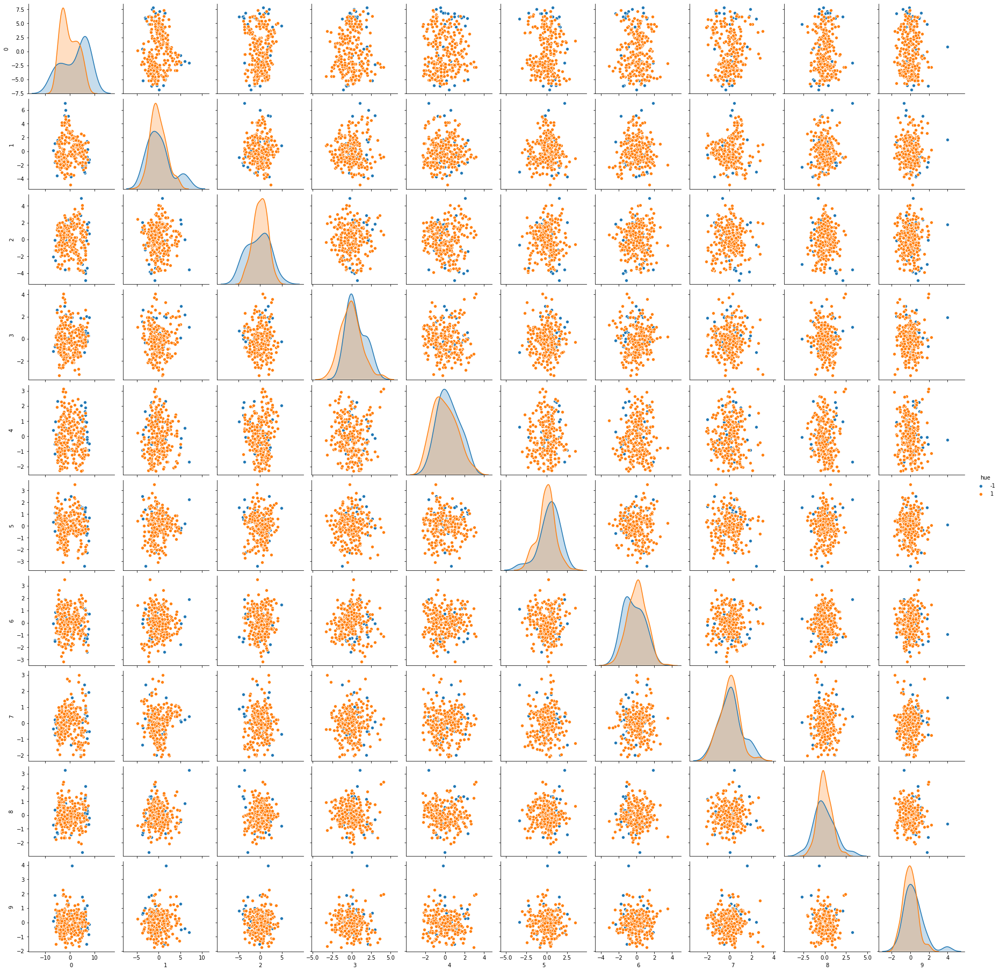

In [30]:
df_scores = pd.DataFrame(scores)
# df_scores
df_scores['hue'] = clf
sn.pairplot(df_scores,hue='hue')

In [31]:
from sklearn import linear_model
#from sklearn.model_selection import cross_val_predict
#from sklearn.metrics import mean_squared_error, r2_score
import statsmodels

# Create linear regression object
regr = linear_model.LinearRegression()
# Fit
regr.fit(x_pc, y_pp)
# Calibration
y_c = regr.predict(x_pc)
# Cross-validation
# y_cv = cross_val_predict(regr, Xreg, y, cv=10)
# Calculate scores for calibration and cross-validation
# score_c = r2_score(y, y_c)
# score_cv = r2_score(y, y_cv)
# Calculate mean square error for calibration and cross validation
# mse_c = mean_squared_error(y, y_c)
fig = px.scatter(x=y_pp,y=y_c)
fig.add_trace(go.Scatter(x=y_pp,y=(0.6394 * y_pp + 5.4914),marker_color='red'))
fig.update_layout(width=500,height=400,
                  margin=dict(l=0, r=0, t=40, b=0),
                 title='Predicted vs. Actual Crime Density',
                 xaxis_title='Actual Crime Density',
                 yaxis_title='Predicted Crime Density',
                 showlegend=False)
fig.write_html('final_corr_plot.html', include_plotlyjs='cdn')
results = px.get_trendline_results(fig)
#print(results.iloc[0].summary())

fig.show()

In [32]:
df_x_pc = pd.DataFrame(x_pc)
df_x_pc.columns = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10']


#df['geom']
df_y_c = pd.DataFrame(y_c, columns = ['y_pred'])
df_y_pp = pd.DataFrame(y_pp, columns = ['y_orig'])

df_sr = pd.concat([df[['geom','beat_num']],df_x_pc,df_y_pp,df_y_c], axis = 1)
df_sr.rename(columns = {'geom' : 'geometry'}, inplace=True)
df_sr.dropna(inplace=True)
df_sr['resid'] = df_sr['y_orig'] - df_sr['y_pred']
gj_sr = geoTim.df_to_geojson(df_sr)

In [33]:
df_sr

,geometry,beat_num,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,y_orig,y_pred,resid
0,"MULTIPOLYGON (((-87.66602 41.85233, -87.66602 ...",1034,-0.659674,4.202608,-1.933396,1.990488,0.379916,0.866484,0.902122,0.512646,1.698786,-1.112358,13.132424,14.187482,-1.055058
1,"MULTIPOLYGON (((-87.63193 41.86015, -87.63117 ...",0914,-0.391881,-0.048939,-0.865302,-0.391334,1.535296,0.770655,-0.002508,2.627314,1.292150,-0.701330,13.418357,15.766225,-2.347868
2,"MULTIPOLYGON (((-87.73570 41.88766, -87.73569 ...",1113,-5.707532,-0.366820,-1.354479,0.188206,0.118050,0.505917,-0.825818,0.447587,-0.696234,-1.499351,18.559904,16.396362,2.163542
3,"MULTIPOLYGON (((-87.63562 41.86009, -87.63451 ...",1235,1.057634,2.127530,-1.421413,2.348203,0.669142,0.408989,0.668679,0.224377,0.855709,-1.538963,12.400632,13.979324,-1.578692
4,"MULTIPOLYGON (((-87.67215 41.99078, -87.67179 ...",2012,4.252131,0.279572,0.920613,1.057422,0.237758,0.420393,0.268076,-1.225620,-0.521120,-0.700159,11.563992,12.474489,-0.910496
5,"MULTIPOLYGON (((-87.72656 41.91717, -87.72655 ...",2534,-3.021266,2.344615,-1.112934,-0.855621,-0.587216,0.825929,-1.157464,0.715957,-0.436586,0.017020,17.595799,16.024849,1.570950
6,"MULTIPOLYGON (((-87.67217 41.89599, -87.67216 ...",1221,1.200214,0.940293,-2.358061,0.724941,1.167875,-0.647563,0.723494,-1.260239,-0.595002,-0.630204,13.607844,14.571326,-0.963482
7,"MULTIPOLYGON (((-87.73290 41.87700, -87.73289 ...",1131,-6.044601,-0.438640,-2.512932,-0.463522,0.966153,0.515481,0.859217,0.006734,-0.680531,-0.341256,17.395322,16.119537,1.275784
8,"MULTIPOLYGON (((-87.71500 41.85166, -87.71499 ...",1013,-1.915060,4.862222,0.760053,2.048907,-1.164830,-0.538303,0.188605,0.503843,0.361543,-1.308804,15.623745,13.046883,2.576862
9,"MULTIPOLYGON (((-87.65804 42.00558, -87.65742 ...",2432,2.154617,-0.430775,-1.166860,0.849974,-1.019458,-0.497945,0.380441,0.389512,-0.366880,-1.264320,14.975804,16.184887,-1.209083


In [34]:
token = open("C:\\Users\\comp\\Documents\\New York\\token").read()

# GEOPANDAS IS STUPID AND CAUSES DEPENDENCY ISSUES
# zip code 00083 is central park!

fig = px.choropleth_mapbox(df_sr, 
                    geojson=gj_sr,
                    locations='beat_num',
                    featureidkey= 'properties.beat_num',
                    color = 'resid',
                    zoom=8, center = {"lat": 40, "lon": -73},)

# doesn't work with mapbox
#fig.update_geos(fitbounds="locations")
fig.update_layout(mapbox_style="light", mapbox_accesstoken = token)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()


In [55]:
#import pysal as ps

gdf = gpd.GeoDataFrame(df_sr)

#y = gdf['y_orig'].to_numpy()
#x=data[XVars].as_matrix()
#x = gdf.columns[2:12].to_numpy()

#drop a duplicate 
#gdf.drop(246,axis=0, inplace=True)
gdf = gdf[gdf['beat_num'] != '3100']
gdf = gdf[gdf['beat_num'] != '1655']
gdf = gdf[gdf['beat_num'] != '1651']
gdf = gdf[gdf['beat_num'] != '1652']
gdf = gdf[gdf['beat_num'] != '1653']

#print(gdf[gdf.duplicated(subset='beat_num')])

gdf.to_file("crime_gdf.geojson", driver='GeoJSON')
gdf.to_file("crime_gdf.shp")

#gdf.iloc[245,:]


#libpysal.weights.Queen

#ols=ps.spreg.OLS(Y,X,w=w,name_y=YVar, name_x=XVars,nonspat_diag=False, spat_diag=True)
#print ols.summary

In [56]:
regr.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'normalize': False}

In [ ]:
c = [regr.coef_]
df_c = pd.DataFrame(c).round(2)
df_c.columns = ['PC 1','PC 2','PC 3','PC 4','PC 5','PC 6','PC 7','PC 8','PC 9','PC 10']
df_c.to_html('coef_table.html', index=False)


In [ ]:
regr.intercept_

In [ ]:
regr.score(x_pc, y_pp)

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=3,
                   subplot_titles=("PC 1","PC 2","PC 3","PC 4","PC 5","PC 6","PC 7","PC 8","PC 9",),
                   horizontal_spacing=0.08, vertical_spacing=0.08)

for i in np.arange(9):
    r = int(i / 3) + 1
    c = i % 3 + 1
    print(i, r, c)
    fig.add_trace(
        go.Scatter(x=x_pc[:,i-1], y=y_pp, mode="markers", marker_size=3),
        row=r, col=c)
fig.update_layout(width=500, height=500, margin=dict(l=0, r=0, t=40, b=0),showlegend=False,
                  font=dict(size=8))

fig.write_html('pc_vs_ypp.html', include_plotlyjs='cdn')
fig.show()
    
    
    

In [ ]:
from scipy import stats
#import matplotlib.pyplot as plt


q,e = res = stats.probplot(df_y)
plt.scatter(q[0],q[1])
#plt.plot(q[0],q[0]*e[0] + e[1])
#np.shape(res[0][1])
# print(e)

fig = make_subplots(rows=1,cols=2,subplot_titles=("Histogram","qq Plot"))
fig.add_trace(go.Histogram(x = df_y),row=1,col=1)
fig.add_trace(go.Scatter(x=q[0],y=q[1],mode="markers", marker_color='blue'),row=1,col=2)
fig.add_trace(go.Scatter(x=q[0],y=(q[0]*e[0] + e[1]),marker_color='red'),row=1,col=2)

fig.update_layout(width=600, height=300, margin=dict(l=0, r=0, t=50, b=0),
                  showlegend=False,
                 title_text="Total Crimes per sq. km.")

fig.write_html('crimes_hist_orig.html', include_plotlyjs='cdn')
fig.show()


In [ ]:
from scipy import stats
#import matplotlib.pyplot as plt


q,e = res = stats.probplot(y_pp)
plt.scatter(q[0],q[1])
#plt.plot(q[0],q[0]*e[0] + e[1])
#np.shape(res[0][1])
# print(e)

fig = make_subplots(rows=1,cols=2,subplot_titles=("Histogram","qq Plot"))
fig.add_trace(go.Histogram(x = y_pp),row=1,col=1)
fig.add_trace(go.Scatter(x=q[0],y=q[1],mode="markers", marker_color='blue'),row=1,col=2)
fig.add_trace(go.Scatter(x=q[0],y=(q[0]*e[0] + e[1]),marker_color='red'),row=1,col=2)

fig.update_layout(width=600, height=300, margin=dict(l=0, r=0, t=50, b=0),
                  showlegend=False,
                 title_text="Total Crimes per sq. km.")

fig.write_html('crimes_hist_trans.html', include_plotlyjs='cdn')
fig.show()

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111)
#x = stats.loggamma.rvs(c=2.5, size=500)
res = stats.probplot(df_y, dist=stats.loggamma, sparams=(2.5,), plot=ax)
ax.set_title("Probplot for loggamma dist with shape parameter 2.5")

In [ ]:
import numpy as np
from sklearn.impute import KNNImputer
#X = [[1, 2, np.nan], [3, 4, 3], [np.nan, 6, 5], [8, 8, 7]]
imputer = KNNImputer(n_neighbors=2)
imputer.fit_transform(df[df.columns[7:15]])

In [ ]:
df[df.columns[5:10]]